<a href="https://colab.research.google.com/github/MikailINTech/NLP_Mails/blob/main/MAT5014_Emails_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Motivations

As part of the course MAT5014, we had to choose a database between 6. We decided to work on the emails database. This database enables us to address behavioural issues from websites, an issue of particular interest to us. We can find on the web different paper explaining the differences in the way people are addressed regarding their race or gender. However, the behaviours of websites are much more complex. Are some words used more than others? Are there privileged contact hours? We wanted to get to the heart of the matter by launching ourselves into an analysis based on the database provided to us. We then asked ourselves, is it possible to highlight a customer-oriented behaviour of websites on the basis of the e-mails sent?

# Plan


1. [Getting Started](#Getting-Started)
    * [Setting up the environment](#Setting-up-the-environment:)
    * [Dataset description](#The-data:)
2. [Preprocessing ](#Preprocessing)
    * [Loading  and cleaning the dataset](#)
    * [Language detection](#Cleaning)
    * [Natural Language Preprocessing text Cleaning](#nlp_cleaning)
    
3. [Exploring the data : Data analysis](#Exploring-the-data)
    * [Gender distribution](#Most-similar-to:)
    * [Mails analysis](#Similarities:)
      * [Emails sending hour and date analysis](#)
      * [Analysis of the words' distributions](#)
      * [Analysis of the biggest senders and receivers](#)
4. [Text embedding and Clustering](#the-study)
    * [Briefing about the Universal Sentence Encoder](#)
      * [Mearl illustrating examples](#)
      * [Encoding emails' content and subject description](#)
    *[Embeded vectors' clustering and clusters' analysis](#)
      * [Elbow's method to determine the optimal number of clusters](#)
      * [Emails' content and subject clustering using the optimal number of clusters](#)

5. [Clustering analysis : Profiling](#)
  * [ Clustering on the mail content ](#)   
  * [ Clustering on the mail subject ](#) 
      

6.  [Conclusion and perspectives ](#)
  * [ Comparison between both ](#)
  * [ Other perspectives ](#)


# I. Getting started

## Setting up the environnement

Libraries used:
 * `fastext==0.9.2`: https://pypi.org/project/fasttext/
 * `pandas-profiling==2.10.0`: https://pypi.org/project/pandas-profiling/
 * `gender-guesser==0.4.0`: https://pypi.org/project/gender-guesser/
 * `wordcloud==1.8.1`: http://amueller.github.io/word_cloud/
 * `chart studio`: hhttps://plotly.com/python/getting-started-with-chart-studio/
 * `seaborn==0.8`: https://seaborn.pydata.org/installing.html

In [ ]:
!pip install fasttext
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
!pip install gender_guesser
!pip install wordcloud
!pip install chart_studio

In [ ]:
import tqdm
import codecs
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd # For data handling
import nltk
import string
import seaborn as sns
import nltk
import string
import datetime
import re
import fasttext
import gender_guesser.detector as gender
import plotly.graph_objects as go
import chart_studio.plotly
import tensorflow as tf
import tensorflow_hub as hub



from collections import Counter
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from pandas_profiling import ProfileReport
from nltk.corpus import stopwords          # module for stop words that come with NLTK
from nltk.stem import PorterStemmer        # module for stemming
from nltk.tokenize import TweetTokenizer   # module for tokenizing strings
from collections import defaultdict
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from plotly.offline import iplot
from sklearn.cluster import KMeans
from absl import logging


Setting up the environment for Google's Universal Sentance Encoder. We use Tensorflow Hb (TF) to embed our text data into vector representation. See section 5 for further explanations.

In [ ]:

module_url = "https://tfhub.dev/google/universal-sentence-encoder/4" #@param ["https://tfhub.dev/google/universal-sentence-encoder/4", "https://tfhub.dev/google/universal-sentence-encoder-large/5"]
model = hub.load(module_url)
print ("module %s loaded" % module_url)
def embed(input):
  return model(input)

In [ ]:
sns.set(rc={'figure.figsize':(20, 20)})

## Dataset description

Our dataset contains around 200000 emails campaign sent to users. This includes the emails and their subjects description, the date and time they were sent, the users to whom they were sent to, the sender emails adresses and the provider IP adresses. 


# II. Preprocessing 

Data preprocessing is one of the critical steps in any machine learning project. It includes cleaning and formatting the data before feeding into a machine learning algorithm. For NLP, the preprocessing steps are comprised of the following tasks:

* Tokenizing the string
* Lowercasing
* Removing stop words and punctuation
* Lemmatizing 

In our dataset, in addition to all these steps, we also removed all **missing values**. Indeed, we realized that there were more than hundred missing values for almost all columns which include : *email*, *subject*, *users_email* and *sender_email* columns. 

##  Loading and cleaning the data set

In [ ]:
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Load the data
id = '1h8oE0Ru3vzmLBl93B_sHRlQXpqaUYZ3I'
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('Email_data.csv')

# Load the detection languages model
id1 = '1o8ZU56WQN548V9ec_5BMEZWsEV47s6vn'
downloaded = drive.CreateFile({'id':id1}) 
downloaded.GetContentFile('lid.176.ftz') 

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/__init__.py", line 36, in autodetect
    from google.appengine.api import memcache
ModuleNotFoundError: No module named 'google.appengine'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 33, in <module>
    from oauth2client.contrib.locked_file import LockedFile
ModuleNotFoundError: No module named 'oauth2client.contrib.locked_file'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/googleapiclient/discovery_cache/file_cache.py", line 37, in <module>
    from oauth2client.locked_file import LockedFile
ModuleNotFoundError: No module named 'oauth2client.locked_file'

During handling of the above exception, another exceptio

As formally stated, we got rid of missing values in the dataset. 

In [ ]:
# Read the data and transform date column into Date and Time columns
df = pd.read_csv('Email_data.csv', sep = ',', engine = 'python').copy()
df['Date'] = pd.to_datetime(df['date']).dt.date
df['Time'] = pd.to_datetime(df['date']).dt.time
df = df[df.user_email.isna() == False]
df = df[df.sender_email.isna() == False]
df = df[df.html_parse.isna() == False]
df = df[df.subject.isna() == False]
df = df.reset_index(drop = True)
del df['date']
df

,html_parse,provider_ip,subject,user_email,sender_email,domain,Date,Time
0,Collision I-405 NB @ SR 167 Collision I-405 N...,209.134.158.19,Collision I-405 NB @ SR 167,jeannine.nicolas@alchemymail.eu,newsletter@email.avnetwork.com,email.avnetwork.com,2020-05-30,18:29:00
1,SB Nation reports.\xc2\xa0From the archivesMa...,139.60.0.204,Record lows may accompany freeze warning issue...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-07-05,19:58:00
2,Stylight - Make Style Happen Encore plus de pr...,83.68.134.56,Profitez des meilleurs deals dès maintenant : ...,maurice.leger@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-05-31,09:09:00
3,Reuters.com Newsletter Visit Reuters.com for ...,65.39.215.207,US money market assets increased in latest wee...,adrien.gaillard@alchemymail.eu,headlines@thestar.ca,thestar.ca,2020-05-14,15:05:00
4,"May 07, 2020 Vol. 106, Iss. 5 Website Table ...",54.240.32.68,The American Journal of Human Genetics: May 20...,manon.carpentier@alchemymail.eu,biblegateway@e.biblegateway.com,e.biblegateway.com,2020-07-05,18:28:00
...,...,...,...,...,...,...,...,...
196542,on Disney+: How to watch Broadway film on str...,192.64.237.241,How coronavirus created a red-hot housing mark...,weston.ragsdale@alchemymail.net,email@email.variety.com,email.variety.com,2020-02-07,12:16:00
196543,BRANDALLEY R\xc3\xa9serv\xc3\xa9 aux membres ...,45.86.117.9,Morgan : Avant-première exclusive,justin.edwards@alchemymail.net,pwfanatic@email.publishersweekly.com,email.publishersweekly.com,2020-01-07,13:13:00
196544,"Se non leggi correttamente questo messaggio, ...",93.174.69.126,L’Espresso presenta “La democrazia costa trop...,otha.moran@alchemymail.net,opportunity@reverbnation.com,reverbnation.com,2020-06-27,14:05:00
196545,Jusqu\'\xc3\xa0 -60% sur une s\xc3\xa9lection...,91.199.29.207,Bijoux d'été en promo ❤,vincent.sessions@alchemymail.net,newsletters@aecf.org,aecf.org,2020-01-07,10:08:00


## Language Detection

We've used the pre-trained fasttext language identification models to identify the languages in the dataset and annote its email to its corresponding language. 

In [ ]:
# Training the languages detection model
path_to_pretrained_model = "lid.176.ftz"
fmodel = fasttext.load_model(path_to_pretrained_model)

In [ ]:
# Applying the languages detection model to our data
def detect_lang_except(l):
  no_features = 0
  try:
      return fmodel.predict(l)[0][0][9:]
  except Exception:
      no_features += 1

In [ ]:
# Detecting the language of each email's content
language = df.html_parse.apply(detect_lang_except)

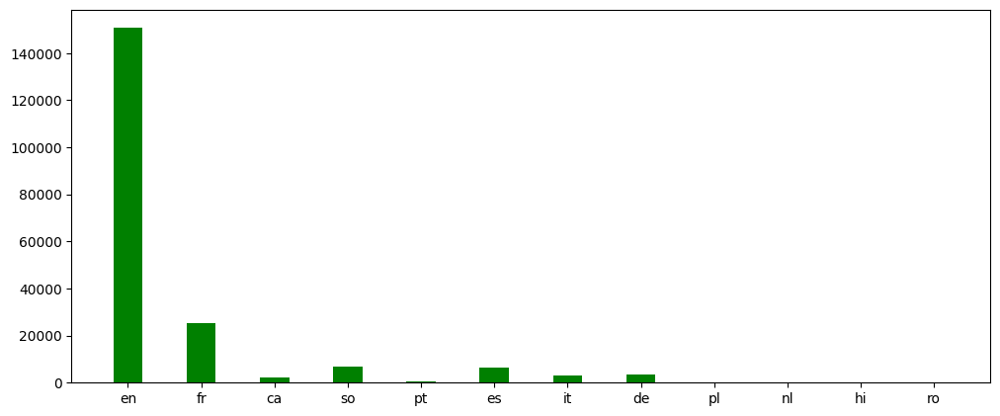

As you may have noticed, 75% of emails are in english. Thus we decided to focus our study in those emails. The same study could be done in the french emails.

In [ ]:
# Keeping only mails in english
df["language"] = language
df = df[ df['language'] == 'en' ]
del df['language']
df = df.reset_index(drop = True).copy()
df.head(5)

,html_parse,provider_ip,subject,user_email,sender_email,domain,Date,Time
0,Collision I-405 NB @ SR 167 Collision I-405 N...,209.134.158.19,Collision I-405 NB @ SR 167,jeannine.nicolas@alchemymail.eu,newsletter@email.avnetwork.com,email.avnetwork.com,2020-05-30,18:29:00
1,SB Nation reports.\xc2\xa0From the archivesMa...,139.60.0.204,Record lows may accompany freeze warning issue...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-07-05,19:58:00
2,Reuters.com Newsletter Visit Reuters.com for ...,65.39.215.207,US money market assets increased in latest wee...,adrien.gaillard@alchemymail.eu,headlines@thestar.ca,thestar.ca,2020-05-14,15:05:00
3,"May 07, 2020 Vol. 106, Iss. 5 Website Table ...",54.240.32.68,The American Journal of Human Genetics: May 20...,manon.carpentier@alchemymail.eu,biblegateway@e.biblegateway.com,e.biblegateway.com,2020-07-05,18:28:00
4,Including: \xe2\x80\x98We don\xe2\x80\x99t ca...,70.33.236.120,Today's Star Headlines,emmanuel.guichard@alchemymail.eu,news@e.reason.com,e.reason.com,2020-04-28,14:02:00


One major issue we had with our dataset was our ability to decode and read properly the content of the ‘hmtl_parse’ column:  some strings were not properly decoded. We could see for examples strings like ‘\xa0’ that are results of problems in the Latin1 decoding. Indeed, ‘\xa0’ is a non-breaking space in Latin1. 
After hours of trials, the best solution we found to solve this problem was to re-decode the mails in ‘unicode_escape’, re-encode them in latin1 and finally re-re-decode them in utf8.


In [ ]:
# Encoding the html parse column
def encode_decode(line):
  try:
    phrase = codecs.decode(line, 'unicode_escape') 
    return phrase.encode('latin1').decode('utf8').replace("\t"," ")
  except Exception:
    return line

In [ ]:
df.html_parse = df.html_parse.apply(str).apply(encode_decode)

In [ ]:
df['html_parse'].head(10)

0     Collision I-405 NB @ SR 167 Collision I-405 N...
1     SB Nation reports. From the archivesMay 7, 19...
2     Reuters.com Newsletter Visit Reuters.com for ...
3     May 07, 2020  Vol. 106, Iss. 5 Website Table ...
4     Including: ‘We don’t catch a break’: First Br...
5     BY MATT COHEN As Trump threatens violence, Bi...
6     The green stalks will be a springtime hit. Vi...
7     Boing Boing  Save on Sanitizers, Masks & More...
8     Also: 737 MAX production restarts; Seattle st...
9     McKinsey&Company Australia’s experience Share...
Name: html_parse, dtype: object

## Natural Language Preprocessing text Cleaning

___

Tokenization is the process of converting a sequence of strings into a sequence of tokens (words, symbols, keywords etc).

The next step is to clean up the tokenized sentence by filtering out stop words and punctuation. Stop words are those words that when removed in a sentence, they do not actually change its deeper meaning. For instance, when someone says "I am happy", removing the pronoun "I" doesn't change anything to the person emotions.

Lemmatization according to Wikipedia "is the process of grouping together the inflected forms of a word so they can be analysed as a single item, identified by the word's lemma, or dictionary form." For instance the words **working** and **worked** will be reduce to their lemma **work**

---



In [ ]:
# Import the english stop words list from NLTK
nltk.download('stopwords')
nltk.download('wordnet')
stop_words = set(stopwords.words('english'))  

# Tokenization and lemmatization functions


"""Even after our decoding again the mails, strings like ‘xa0’ remained. As you can wonder, these strings were supposed to be special strings from the latin1 encoding. 
Unfortunately, there is nothing we can do to decode properly those strings. However, a lot of these kind of strings were polluting our dataset. 
Therefore, as very few words in English start with the letter ‘x’, we decided to remove all of them. This solution is nonetheless not optimal, and could maybe cause issues in other languages."""

def is_not_trash(word):
  return  not (word[0] == 'x')




def clean_words(word):
  if type(word) is str :
    #porter=PorterStemmer()
    wordnet_lemmatizer = WordNetLemmatizer()

    tokenizer = TweetTokenizer(preserve_case = False, strip_handles = True, reduce_len = True)
    tokens = tokenizer.tokenize(word)
    clean = []
    for word in tokens:
        if (word not in stop_words and  # remove stopwords
                word not in string.punctuation and is_not_trash(word)):  # remove punctuation
            word = re.sub(r'https?:\/\/.*[\r\n]*', '', word)
            word = re.sub(r'[^a-zA-Z]', '', word)
            lemma_word = wordnet_lemmatizer.lemmatize(word)  # Lemmatizing word
            clean.append(lemma_word)

    mot = ''
    for i in clean:
      mot += (i+' ')
  return mot

# Applying our function to the subject column
df['subject'] = df['subject'].apply(clean_words)

# Applying our function to the html parse column
df['html_parse'] = df['html_parse'].apply(clean_words) 

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
df['html_parse'].head(12)

0     collision  nb sr  collision  nb sr on  northbo...
1     sb nation report archivesmay   hon dr j leon l...
2     reuterscom newsletter visit reuterscom latest ...
3     may   vol  i  website table content online arc...
4     including   catch break  first brian jean lost...
5     matt cohen trump threatens violence biden offe...
6     green stalk springtime hit view email online c...
7     boing boing save sanitizers mask wellness find...
8     also  max production restarts seattle star hig...
9     mckinsey company australia  experience share e...
10    new unc ver exploit allows jailbreaking apple ...
11    cleared wsdot alert disabled vehicle sr  north...
Name: html_parse, dtype: object

In [ ]:
df['subject'].head(10)

0                                   collision  nb sr  
1    record low may accompany freeze warning issued...
2    u money market asset increased latest week imo...
3    american journal human genetics may  volume  i...
4                                 today star headline 
5    trump campaign always going racism minnesota b...
6                             easy way cook asparagus 
7                    sanitary essential  want toolkit 
8    wednesday evening brief spacex launch scrubbed...
9    curse lucky country search economic antidote c...
Name: subject, dtype: object

In [ ]:
# Cleaning the dataset after tokenization and lemmatization
df = df[ df['html_parse'] != ''].copy()
df = df[ df['html_parse'] != ' '].copy()
df = df[ df['subject'] != ''].copy()
df = df[ df['subject'] != ' '].copy()
df = df.reset_index(drop = True).copy()
df
df.head(10)

,html_parse,provider_ip,subject,user_email,sender_email,domain,Date,Time
0,collision nb sr collision nb sr on northbo...,209.134.158.19,collision nb sr,jeannine.nicolas@alchemymail.eu,newsletter@email.avnetwork.com,email.avnetwork.com,2020-05-30,18:29:00
1,sb nation report archivesmay hon dr j leon l...,139.60.0.204,record low may accompany freeze warning issued...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-07-05,19:58:00
2,reuterscom newsletter visit reuterscom latest ...,65.39.215.207,u money market asset increased latest week imo...,adrien.gaillard@alchemymail.eu,headlines@thestar.ca,thestar.ca,2020-05-14,15:05:00
3,may vol i website table content online arc...,54.240.32.68,american journal human genetics may volume i...,manon.carpentier@alchemymail.eu,biblegateway@e.biblegateway.com,e.biblegateway.com,2020-07-05,18:28:00
4,including catch break first brian jean lost...,70.33.236.120,today star headline,emmanuel.guichard@alchemymail.eu,news@e.reason.com,e.reason.com,2020-04-28,14:02:00
5,matt cohen trump threatens violence biden offe...,192.64.236.61,trump campaign always going racism minnesota b...,raymond.lemaire@alchemymail.eu,enews@emails.wiggle.com,emails.wiggle.com,2020-05-29,22:45:00
6,green stalk springtime hit view email online c...,38.119.56.113,easy way cook asparagus,mathilde.lemoine@alchemymail.eu,news@e.ray-ban.com,e.ray-ban.com,2020-12-05,15:23:00
7,boing boing save sanitizers mask wellness find...,192.174.86.94,sanitary essential want toolkit,quentin.guillaume@alchemymail.eu,newsletter@mail.observer.com,mail.observer.com,2020-05-18,01:09:00
8,also max production restarts seattle star hig...,13.111.5.101,wednesday evening brief spacex launch scrubbed...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-05-28,02:31:00
9,mckinsey company australia experience share e...,142.54.244.228,curse lucky country search economic antidote c...,maurice.leger@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-05-05,01:30:00


# III. Data analysis

### Gender analysis

The aim of our study is to point out a customer-oriented behaviour. An intuitive idea to underline such a behaviour is to suppose that companies use methods with a discourse specifically tailored to the customer’s identity, belongings and interests.

The only information we have about customers is their email address. From email address we can basically reach out the name and the first name of each customer. Indeed, we can observe that the generic format of email addresses is: firstname.name@domain. First name and name constitute a highly discriminative factor in life since from which we can easily guess the gender, the origin and make some suppositions on religion. 

In our dataset, names are generated randomly and can easily be confused with first names. Basically, customers have an aptronym (a first name as a name) which not gives us further relevant information. Thus, we decided to only focus on first names. 

Given that our dataset is made from English speakers, the analysis made on ethnicity is biased. Moreover, no effective ethnicity guesser was found to get relevant results. Consequently, we only focus on gender analysis.


 


In [ ]:
# Get the name of each client from the email
def split_name_from_email(email):
  return email.split("@")[0].split(".")[0].capitalize()

In [ ]:
# Build a clients dataframe
df_client = pd.DataFrame(columns = ['Name','Gender'])
df_client['Name'] = df['user_email'].apply(split_name_from_email)

We then start by extracting the name of each customer of the dataset from his email. For this purpose, we use the library “gender_guesser” which gives us mainly four categories of gender: female, male, unknown and andy for the gender-neutral first names. The difference between andy and unknown is that the former is found to have the same probability to be male than to be female while the later means that the name was not found in the database. It then gives us two categories of mainly female and mainly male for the first names which is not sure. 

In [ ]:
# Find the gender of each client from the name
d = gender.Detector()
def find_gender(name):
  a = d.get_gender(name,'france')
  if a == 'andy':
    a = d.get_gender(name)
  return a

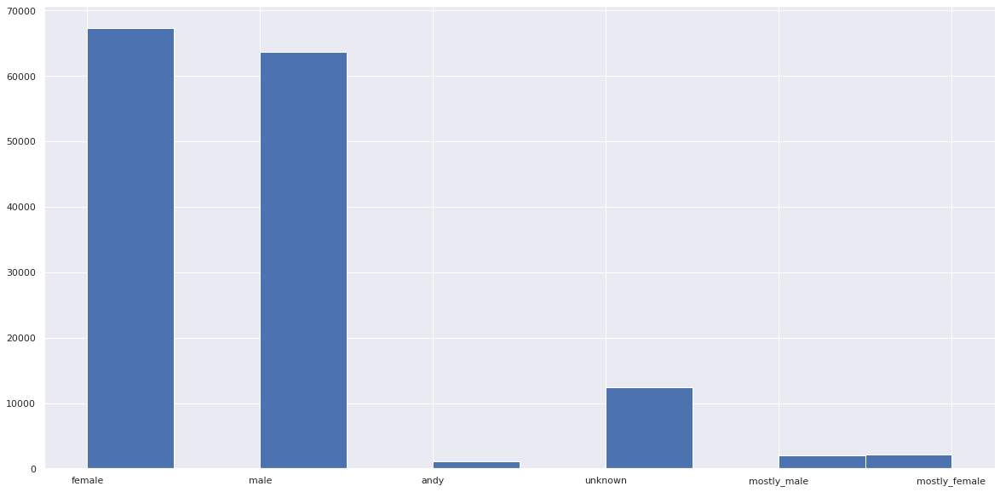

In [ ]:
# Apply our function to the dataset
df_client['Gender'] = df_client['Name'].apply(find_gender)

# Plot the distribution by
sns.set(rc={'figure.figsize':(20, 10)})
df_client['Gender'].hist()

We can observe that the unknown category is attributed 15 000 times. Moreover, the 22 most recurring customers’ first name attributed to an unknown gender represent approximately 50% of those. We then decided to attribute manually the gender of these first names to reduce the unusable customers.  This is motivated by the fact that the other half of those unknown gender are unusual emails with special characters that are forbidden in real life.


In [ ]:
# Select the client with unknown gender
df_unknown_clients = df_client[df_client['Gender'] == 'unknown']

# Get the occurence of each client with an unknown gender
Counter(df_unknown_clients['Name'].values)
df_unknown_clients_occurence = pd.DataFrame(list(Counter(df_unknown_clients['Name'].values).items()),columns = ['Name','Occurence'])

# Keep only the 22 most recurring client's name with unknown gender
df_unknown_clients_occurence = df_unknown_clients_occurence.sort_values(by = ['Occurence'],ascending = False).head(22)

# Attribute manually the gender the 22 msot recurring client's name with unknown gender
gender_unknown = ['male','female','female','male','female','female','male','female','male','male','female','female','female','male','female','female','female','female','female','female','female','male']
df_unknown_clients_occurence['Gender'] = gender_unknown

For the mostly male and female categories, according to the documentation of gender guesser library, the algorithm attributes a gender probability for undermined names. Then, we decided to merely attribute them respectively to male and female categories to make the study feasible.

In [ ]:
# Function used to complete the gender analysis
def complete_gender(line):
  if line['Gender'] == 'unknown':
     if line['Name'] in df_unknown_clients_occurence['Name'].values:
          line['Gender']= df_unknown_clients_occurence[df_unknown_clients_occurence['Name'] == line['Name']]['Gender'].values[0]
  elif line['Gender'] == 'mostly_male':
    line['Gender'] = 'male'
  elif line['Gender'] == 'mostly_female':
    line['Gender'] = 'female'
  return line

In [ ]:
# Complete the gender analysis on the clients' dataset
df_client = df_client.apply(complete_gender, axis = 1)
df_client.head(10)

,Name,Gender
0,Jeannine,female
1,Pauline,female
2,Adrien,male
3,Manon,female
4,Emmanuel,male
5,Raymond,male
6,Mathilde,female
7,Quentin,male
8,Pauline,female
9,Maurice,male


After this process, we plot the gender distribution of our dataset. 

In [ ]:
# Histogram of gender distribution in our dataset
df_client['Gender'].hist()

This analysis highlights the proportion of men is equivalent to that of women, even if there is a slight numerical superiority of women. No relevant and concrete conclusion can be done to explain this distribution. However, we have to bear in mind that this fact can be highlight before our cleaning process. Thus, the later did not affect the distribution and seems not to be unfounded. To conclude, senders appear to more target women than men. This analysis can be refined by studying the content of mails and their subjects, given the gender.

In [ ]:
# Add the columns gender and name to our dataset and drop the still remaining unknwon genders
df['Name'] = df_client['Name']
df['Gender'] = df_client['Gender']
df = df[ df['Gender'] != 'unknown'].copy()
df = df.reset_index(drop = True).copy()
df.head(5)

,html_parse,provider_ip,subject,user_email,sender_email,domain,Date,Time,Name,Gender
0,collision nb sr collision nb sr on northbo...,209.134.158.19,collision nb sr,jeannine.nicolas@alchemymail.eu,newsletter@email.avnetwork.com,email.avnetwork.com,2020-05-30,18:29:00,Jeannine,female
1,sb nation report archivesmay hon dr j leon l...,139.60.0.204,record low may accompany freeze warning issued...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-07-05,19:58:00,Pauline,female
2,reuterscom newsletter visit reuterscom latest ...,65.39.215.207,u money market asset increased latest week imo...,adrien.gaillard@alchemymail.eu,headlines@thestar.ca,thestar.ca,2020-05-14,15:05:00,Adrien,male
3,may vol i website table content online arc...,54.240.32.68,american journal human genetics may volume i...,manon.carpentier@alchemymail.eu,biblegateway@e.biblegateway.com,e.biblegateway.com,2020-07-05,18:28:00,Manon,female
4,including catch break first brian jean lost...,70.33.236.120,today star headline,emmanuel.guichard@alchemymail.eu,news@e.reason.com,e.reason.com,2020-04-28,14:02:00,Emmanuel,male


### Emails analysis

#### Time distribution of emails' sending

A simple study we can make with our dataset is to analyze the time distribution of emails sending. Indeed, websites usually send their emails at optimal hours, for example before lunchtime or in the afternoon. We saw on the web that often, between 9:00 AM to 2:00 PM is considered as the best period. Let’s see if we get the same conclusion.

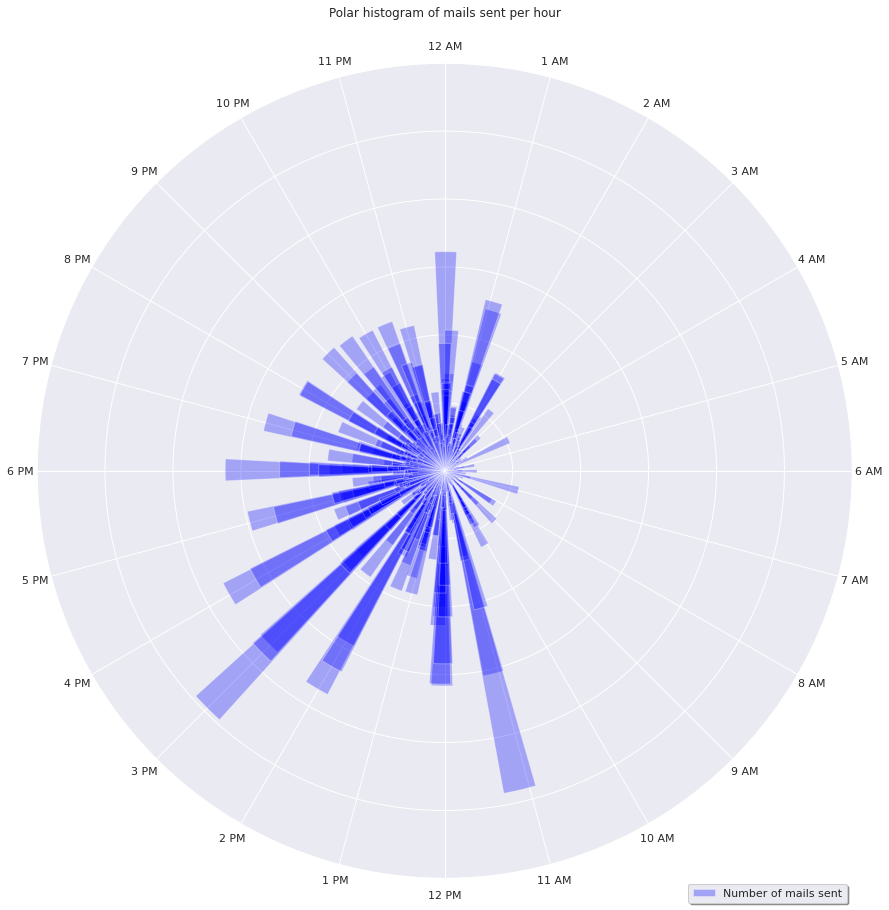

In [ ]:
# Get the different times emails sending and their occurence
Counter(df['Time'].values)
df_time = pd.DataFrame(list(Counter(df['Time'].values).items()),columns = ['Time','Occurence'])

# Polar distribution of the emails sending's hours
xs = pd.to_datetime(df_time['Time'],format= '%H:%M:%S' )
xs = xs - datetime.datetime.strptime('00:00:00', '%H:%M:%S')
xs = xs.dt.seconds / (24 * 3600)
xs = xs * 2 * np.pi
hour_list = [t.hour for t in df['Time']]
numbers=[x for x in range(25)]
labels = map(lambda x: str(x), numbers)
fig = plt.figure(figsize=(15,15))
ax = plt.subplot(111, projection = 'polar')
ax.bar(xs, df_time['Occurence'], width = 0.1, alpha=0.3, color='blue', label='Number of mails sent')

# Make the labels go clockwise
ax.set_theta_direction(-1)

#Place Zero at Top
ax.set_theta_offset(np.pi/2)

#Set the circumference ticks
ax.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=False))

# set the label names
ticks = ['12 AM', '1 AM', '2 AM', '3 AM', '4 AM', '5 AM', '6 AM', '7 AM','8 AM','9 AM','10 AM','11 AM','12 PM', '1 PM', '2 PM', '3 PM', '4 PM',  '5 PM', '6 PM', '7 PM', '8 PM', '9 PM', '10 PM', '11 PM' ]
ax.set_xticklabels(ticks)

# suppress the radial labels
plt.setp(ax.get_yticklabels(), visible=False)

#Bars to the wall
plt.ylim(0,1200)

plt.legend(bbox_to_anchor=(1,0), fancybox=True, shadow=True)
plt.title('Polar histogram of mails sent per hour')
plt.show()

We can see on our polar histogram that the distribution of email sending is pretty much the one we expected. Most of emails are send during the beginning of the afternoon, with peaks at 11 am and 15 am.

#### Analysis of the words' distributions 

Once the gender analysis done, we decided to focus on emails’ and subject content. The idea is to point out the most used words in our dataset in order to compare differences between emails’ content and subjects. Overall, emails’ subject goes straight forward to the main idea that the sender wants to give and might then give us a more precise analysis on the purpose of each email. The second idea is to determine the most recurrent subjects covered and highlight this through the time analysis that has been done previously.

In [ ]:
# Compute the occurence of each word in each email of the data set
def freq_mail(sentences):
  tokenizer = TweetTokenizer(preserve_case=False, strip_handles=True, reduce_len=True)
  word_freq = defaultdict(int)
  for sent in sentences:
    for i in tokenizer.tokenize(sent):
        word_freq[i] += 1
  return word_freq,len(word_freq)

In [ ]:
# Occurence of each word in the emails' content
freq_html_parse, len_freq_html_parse = freq_mail(df['html_parse'])
sorted(freq_html_parse, key = freq_html_parse.get, reverse = True)

['email',
 'read',
 'new',
 'view',
 'u',
 'privacy',
 'news',
 'unsubscribe',
 'newsletter',
 'right',
 'may',
 'policy',
 'update',
 'covid',
 'coronavirus',
 'sent',
 'preference',
 'time',
 'please',
 'state',
 'get',
 'alert',
 'browser',
 'day',
 'one',
 'click',
 'medium',
 'business',
 'service',
 'use',
 'receive',
 'manage',
 'copyright',
 'address',
 'subscription',
 'today',
 'book',
 'help',
 'term',
 'june',
 'information',
 'pandemic',
 'profile',
 'week',
 'see',
 'people',
 'trump',
 'york',
 'message',
 'llc',
 'subscribe',
 'washington',
 'like',
 'home',
 'say',
 'center',
 'add',
 'make',
 'bible',
 'contact',
 'year',
 'story',
 'communication',
 'online',
 'work',
 'reserved',
 'th',
 'list',
 'visit',
 'health',
 'free',
 'offer',
 'breaking',
 'first',
 'inc',
 'world',
 'sign',
 'need',
 'way',
 'variety',
 'life',
 'stay',
 'street',
 'said',
 'gateway',
 'daily',
 'ave',
 'delivery',
 'department',
 'ad',
 'know',
 'case',
 'shop',
 'sr',
 'using',
 'milepos

In [ ]:
# Occurence of each word in the emails' subject
freq_subject, len_freq_subject = freq_mail(df['subject'])
sorted(freq_subject, key = freq_subject.get, reverse = True)

['alert',
 'milepost',
 'new',
 'wsdot',
 'coronavirus',
 'today',
 'news',
 'trump',
 'may',
 'covid',
 'sr',
 'june',
 'day',
 'u',
 'daily',
 'collision',
 'cleared',
 'say',
 'traffic',
 'impact',
 'breaking',
 'st',
 'headline',
 'star',
 'week',
 'report',
 'update',
 'get',
 'direction',
 'pandemic',
 'nb',
 'sb',
 'case',
 'police',
 'death',
 'home',
 'southbound',
 'vehicle',
 'state',
 'sale',
 'top',
 'best',
 'reading',
 'northbound',
 'plan',
 'business',
 'summer',
 'th',
 'time',
 'house',
 'morning',
 'protest',
 'health',
 'disabled',
 'life',
 'live',
 'exclusive',
 'back',
 'black',
 'reopening',
 'call',
 'way',
 'biden',
 'bridge',
 'george',
 'need',
 'free',
 'show',
 'last',
 'first',
 'deal',
 'tv',
 'next',
 'watch',
 'county',
 'story',
 'bible',
 'work',
 'take',
 'reopen',
 'could',
 'one',
 'year',
 'make',
 'floyd',
 'end',
 'film',
 'set',
 'america',
 'american',
 'right',
 'florida',
 'million',
 'night',
 'newsletter',
 'review',
 'issue',
 'season',

In [ ]:
# Transform a dataframe of string into a single string
def single_text(df):
  txt = ''
  for i in df.index:
    if df[i][-1] == ' ' :
      txt += df[i]
    else :
      txt += df[i] + ' '
  return txt

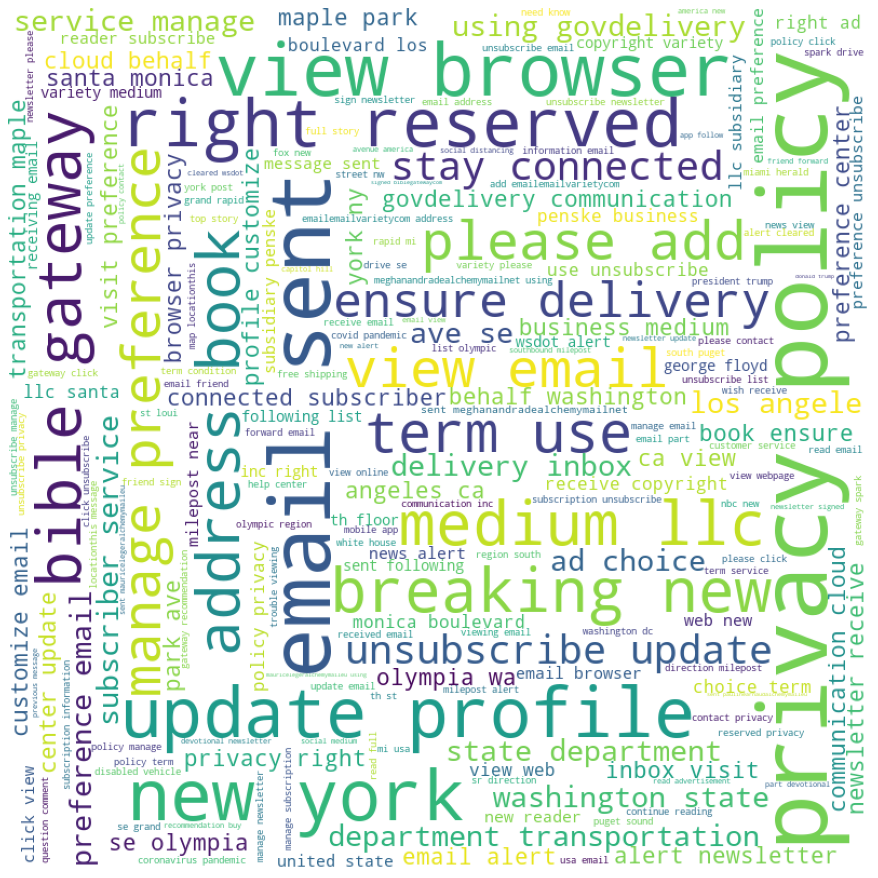

In [ ]:
# Words cloud of the emails' content
all_html_parse = single_text(df['html_parse'])
wordcloud_html_parse = WordCloud(width = 800, height = 800, background_color ='white').generate(all_html_parse)
plt.figure(figsize = (12, 12), facecolor = None) 
plt.imshow(wordcloud_html_parse)
plt.axis("off") 
plt.tight_layout(pad = 0)

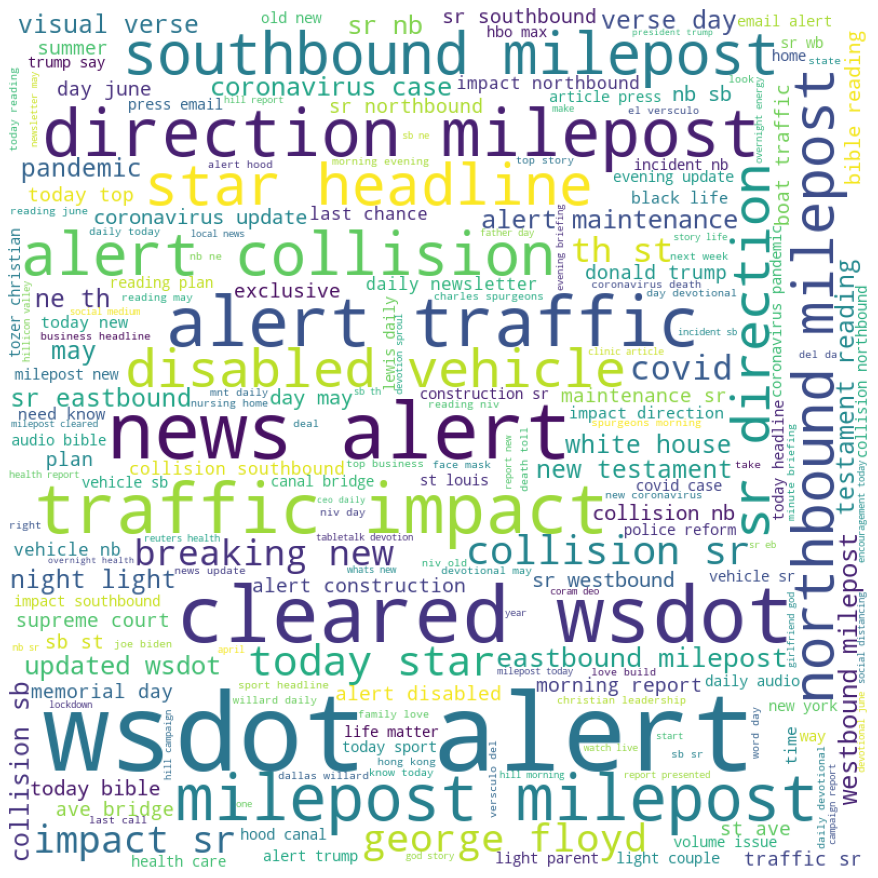

In [ ]:
# Words cloud of the emails' subject
all_subject = single_text(df['subject'])
wordcloud_subject = WordCloud(width = 800, height = 800, background_color ='white').generate(all_subject)
plt.figure(figsize = (12, 12), facecolor = None) 
plt.imshow(wordcloud_subject)
plt.axis("off") 
plt.tight_layout(pad = 0) 

First of all, we can notice that the subjects’ content is composed in some ways of violent words, and overall, with strong impact words. The strategy used by the senders is the clickbait marketing strategy. The idea is to use sensational headlines with the sole purpose of luring users into an attractive insight of what they can potentially find in the email. Whereas the emails content is more made of general words.

####  Analysis of the biggest senders and receivers

In [ ]:
# Distribution of the biggest emails senders, which have sent more than 2000 emails
sender = [go.Bar(
            x = df.sender_email.unique()[:7],
            y = df.sender_email.value_counts().iloc[:7].values,
            marker= dict(colorscale='Jet',
                         color = df.sender_email.value_counts().values
                        ),
    )]


layout = go.Layout(title = 'Biggest emails senders')
fig = go.Figure(data=sender, layout=layout)
iplot(fig, filename = 'basic-bar')


In [ ]:
# Distribution of the biggest user receivers, which have received more than 1000 emails
user = [go.Bar(
            x = df.user_email.unique()[:20],
            y = df.user_email.value_counts().iloc[:20].values,
            marker= dict(colorscale='Jet',
                         color = df.user_email.value_counts().values
                        ),
    )]


layout_user = go.Layout(title = 'Biggest emails receivers' )

fig = go.Figure(data=user, layout=layout_user)

iplot(fig, filename='basic-bar')

###Analysis of the Biggest Cities sending mails through IP address

In [ ]:
!pip install ip2geotools

In [ ]:
from ip2geotools.databases.noncommercial import DbIpCity
from ip2geotools import errors


distinct_ip = df['provider_ip'].unique()

ip_counts = df['provider_ip'].value_counts().values
i=0
ips=[]
country=[]
city=[]
count=[]
long=[]
lat=[]


for ip in distinct_ip[:1000]:
  try:
    print("itération : " + str(i))
    response = DbIpCity.get(ip, api_key='free')
    if response.city in city:
      j = city.index(response.city)
      count[j]+=ip_counts[i]
    else :
      country.append(response.country)
      city.append(response.city)
      count.append(ip_counts[i])
      long.append(response.longitude)
      lat.append(response.latitude)
    i+=1
  except errors.InvalidRequestError:
    i+=1
    print( " This IP adress is not recognized : " + str(ip))




In [ ]:
d = { 'coutry': country, 'city' : city, 'long' : long, 'lat' : lat, 'count' : count}
locations = pd.DataFrame(data=d)

locations

,coutry,city,long,lat,count
0,US,Saint Paul (Core),NaN,NaN,12152
1,US,Ashburn,-77.487490,39.043719,4918
2,US,New York,-74.006015,40.712728,20083
3,CA,Montreal,-73.610364,45.497216,3522
4,CA,Toronto,-79.383935,43.653482,3288
...,...,...,...,...,...
91,US,San Francisco (Financial District),-122.396311,37.793941,32
92,GB,Harrow on the Hill,-0.336656,51.579270,17
93,US,Cheyenne,-104.820246,41.139981,16
94,FR,Lille,3.063528,50.636565,14


### Dataset analysis

In [ ]:
# Data set analysis with ProfileReport library
profile = ProfileReport(df, title = "Rapport de la BDD e-mails", html = {'style':{'full_width':False}})
profile

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# IV. Text embedding and Clustering

## Briefing about Universal Sentance Encoder

In Natural Language Processing, before building any model, we need to convert text into numbers. Indeed, since ML algorithms cannot work with raw text directly, the text has to be converted to vectors of numbers by for instance building a vocabulary that allows to encode any text as an array of numbers.

To encode a sentance into vectors, many approaches can be used. A vocabulary of unique words in the whole dataset can be built and we can used one hot enconding to embed each sentence. However, this results in a sparse vector with huge dimensions. Indeed, the vector representation size in this case grows with corpus. Another simple and common approach is to embed each word of the sentance (word embeddings) and average all vectors to obtain the sentance embedding. This latter approach results in loss of information. This is where Google's Universal Sentance Encoder comes into action. It provides us with a model that maps any given sentence to a fixed-length vector representation.

<img src="https://amitness.com/images/use-overall-pipeline.png" alt="drawing" width="900"/>


The Google's Universal Sentance Encoder was introduced in the following [paper](https://arxiv.org/abs/1803.11175) on April 2018, by a team of researchers at Google. The researchers provide two models to encode a sentence into vector. The first one uses a Transformer Architecture and the second one uses a Deep Average Network (DAN) to encode strings into embedding vectors. The implementation was done in Tensorflow. You can download the models here [USE](https://radimrehurek.com/gensim/index.html). 

Since our study mainly consist in analyzing emails sent by companies to users in order to highlight a customer-oriented behaviour, we therefore have to take into account semantic simarity. Semantic similarity is a measure of the degree to which two pieces of text carry the same meaning. The Universal Sentance Encoder can be used to find out the relations between sentences in a our dataset, compute the similarity between them, or use the vector representation of those sentences as input for clustering.


<img src="https://www.gstatic.com/aihub/tfhub/universal-sentence-encoder/example-similarity.png" alt="drawing" width="900"/>

### Mearl illustrating examples

These are some examples highlighting USE. You can refer to the impletentation of the model for further examples and explanations.

In [ ]:
# Some examples
phrase = "I am crying"
word = "I love eating pizza"
virus = 'train collision at paris'
sentence = "I am an engineering student at harvard."
paragraph = "we are going on vacation"
nabil = "covid 19 is dangerous virus"
messages = [phrase, word, virus, sentence, paragraph, nabil]

# Reduce logging output.
logging.set_verbosity(logging.ERROR)

message_embeddings = embed(messages)

for i, message_embedding in enumerate(np.array(message_embeddings).tolist()):
  print("Message: {}".format(messages[i]))
  print("Vector size: {}".format(len(message_embedding)))
  message_embedding_snippet = ", ".join(
      (str(x) for x in message_embedding[:3]))
  print("Vector embedding: [{}, ...]\n".format(message_embedding_snippet))

### Encoding emails' content and subject

In [ ]:
# Function to embed the whole dataset
def embed_email(s):
  return(embed([s]))

In [ ]:
# Embedding of emails' content and subject
df['html_parse_vector'] = df['html_parse'].apply(embed_email)
df['subject_vector'] = df['subject'].apply(embed_email)

# Transform our embeded vectors into array
def get_embeddings_as_list(T):
    return np.array(T).tolist()[0]

# Add embedded vectors to our dataset
df['html_parse_embedding'] = df.html_parse_vector.apply(get_embeddings_as_list)
df['subject_embedding'] = df.subject_vector.apply(get_embeddings_as_list)

# Get rid of vectors
del df['html_parse_vector']
del df['subject_vector']
df.head(10)

,html_parse,provider_ip,subject,user_email,sender_email,domain,Date,Time,Name,Gender,html_parse_embedding,subject_embedding
0,collision nb sr collision nb sr on northbo...,209.134.158.19,collision nb sr,jeannine.nicolas@alchemymail.eu,newsletter@email.avnetwork.com,email.avnetwork.com,2020-05-30,18:29:00,Jeannine,female,"[0.003147316398099065, 0.01779928058385849, -0...","[0.0016082393703982234, -3.4970416891155764e-0..."
1,sb nation report archivesmay hon dr j leon l...,139.60.0.204,record low may accompany freeze warning issued...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-07-05,19:58:00,Pauline,female,"[0.023100772872567177, -0.05607752874493599, -...","[0.04822928458452225, -0.0035446160472929478, ..."
2,reuterscom newsletter visit reuterscom latest ...,65.39.215.207,u money market asset increased latest week imo...,adrien.gaillard@alchemymail.eu,headlines@thestar.ca,thestar.ca,2020-05-14,15:05:00,Adrien,male,"[-0.050299085676670074, -0.050852835178375244,...","[-0.003198302583768964, -0.01191636361181736, ..."
3,may vol i website table content online arc...,54.240.32.68,american journal human genetics may volume i...,manon.carpentier@alchemymail.eu,biblegateway@e.biblegateway.com,e.biblegateway.com,2020-07-05,18:28:00,Manon,female,"[0.04659486934542656, -0.05203971639275551, 0....","[0.004032701253890991, -0.006201236043125391, ..."
4,including catch break first brian jean lost...,70.33.236.120,today star headline,emmanuel.guichard@alchemymail.eu,news@e.reason.com,e.reason.com,2020-04-28,14:02:00,Emmanuel,male,"[-0.011332928203046322, -0.05580546334385872, ...","[-0.02389116957783699, -0.028314905241131783, ..."
5,matt cohen trump threatens violence biden offe...,192.64.236.61,trump campaign always going racism minnesota b...,raymond.lemaire@alchemymail.eu,enews@emails.wiggle.com,emails.wiggle.com,2020-05-29,22:45:00,Raymond,male,"[-0.048211172223091125, -0.049044251441955566,...","[0.03380407392978668, -0.011782534420490265, -..."
6,green stalk springtime hit view email online c...,38.119.56.113,easy way cook asparagus,mathilde.lemoine@alchemymail.eu,news@e.ray-ban.com,e.ray-ban.com,2020-12-05,15:23:00,Mathilde,female,"[-0.05337702855467796, -0.045924920588731766, ...","[-0.01004011370241642, 0.010051083751022816, 0..."
7,boing boing save sanitizers mask wellness find...,192.174.86.94,sanitary essential want toolkit,quentin.guillaume@alchemymail.eu,newsletter@mail.observer.com,mail.observer.com,2020-05-18,01:09:00,Quentin,male,"[-0.07027013599872589, -0.0792643278837204, 0....","[-0.010575145483016968, -0.0491148978471756, -..."
8,also max production restarts seattle star hig...,13.111.5.101,wednesday evening brief spacex launch scrubbed...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-05-28,02:31:00,Pauline,female,"[-0.05407292768359184, -0.0547172911465168, -0...","[0.007875783368945122, -0.04583965614438057, -..."
9,mckinsey company australia experience share e...,142.54.244.228,curse lucky country search economic antidote c...,maurice.leger@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-05-05,01:30:00,Maurice,male,"[-0.045804306864738464, -0.054601408541202545,...","[-0.0026050396263599396, -0.06639032810926437,..."


## Embeded vectors' clustering and clusters' analysis

### Elbow's method to determine the optimal number of clusters

In [ ]:
# Elbow method for emails' subject
a = []
for i in range(1,20):
    kmeans = KMeans(n_clusters = i)
    kmeans.fit(np.array(df_vector['subject_embedding']).tolist())
    a.append(kmeans.inertia_)
plt.scatter(range(1,20), a)
plt.plot(range(1,20), a)

In [ ]:
# Elbow method for emails' html_parse
b = []
for i in range(1,20):
    kmeans = KMeans(n_clusters = i)
    kmeans.fit(np.array(df_vector['html_parse_embedding']).tolist())
    b.append(kmeans.inertia_)
plt.scatter(range(1,20), b)
plt.plot(range(1,20), b)

After vectorizing our emails, we decided to determine the major themes that are in our dataset. To do so we did an unsupervised clustering, in order to know the best number of clusters we used the elbow method on the inertia graph. 

We used this method on the email subjects and email contents. As we can see on the graph above the appropriate number of clusters is 4.


### Emails' content and subject clustering using the optimal number of clusters

In [ ]:
# Kmeans for the subject
kmeans_subject = KMeans(n_clusters = 4)
kmeans_subject.fit(np.array(df['subject_embedding']).tolist())
df['subject_labels'] = kmeans_subject.labels_

# Kmeans for the content
kmeans_html_parse = KMeans(n_clusters = 4)
kmeans_html_parse.fit(np.array(df['html_parse_embedding']).tolist())
df['html_parse_labels'] = kmeans_html_parse.labels_

df.head(10)

,html_parse,provider_ip,subject,user_email,sender_email,domain,Date,Time,Name,Gender,html_parse_embedding,subject_embedding,subject_labels,html_parse_labels
0,collision nb sr collision nb sr on northbo...,209.134.158.19,collision nb sr,jeannine.nicolas@alchemymail.eu,newsletter@email.avnetwork.com,email.avnetwork.com,2020-05-30,18:29:00,Jeannine,female,"[0.003147316398099065, 0.01779928058385849, -0...","[0.0016082393703982234, -3.4970416891155764e-0...",1,2
1,sb nation report archivesmay hon dr j leon l...,139.60.0.204,record low may accompany freeze warning issued...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-07-05,19:58:00,Pauline,female,"[0.023100772872567177, -0.05607752874493599, -...","[0.04822928458452225, -0.0035446160472929478, ...",3,0
2,reuterscom newsletter visit reuterscom latest ...,65.39.215.207,u money market asset increased latest week imo...,adrien.gaillard@alchemymail.eu,headlines@thestar.ca,thestar.ca,2020-05-14,15:05:00,Adrien,male,"[-0.050299085676670074, -0.050852835178375244,...","[-0.003198302583768964, -0.01191636361181736, ...",0,3
3,may vol i website table content online arc...,54.240.32.68,american journal human genetics may volume i...,manon.carpentier@alchemymail.eu,biblegateway@e.biblegateway.com,e.biblegateway.com,2020-07-05,18:28:00,Manon,female,"[0.04659486934542656, -0.05203971639275551, 0....","[0.004032701253890991, -0.006201236043125391, ...",3,3
4,including catch break first brian jean lost...,70.33.236.120,today star headline,emmanuel.guichard@alchemymail.eu,news@e.reason.com,e.reason.com,2020-04-28,14:02:00,Emmanuel,male,"[-0.011332928203046322, -0.05580546334385872, ...","[-0.02389116957783699, -0.028314905241131783, ...",2,3
5,matt cohen trump threatens violence biden offe...,192.64.236.61,trump campaign always going racism minnesota b...,raymond.lemaire@alchemymail.eu,enews@emails.wiggle.com,emails.wiggle.com,2020-05-29,22:45:00,Raymond,male,"[-0.048211172223091125, -0.049044251441955566,...","[0.03380407392978668, -0.011782534420490265, -...",3,3
6,green stalk springtime hit view email online c...,38.119.56.113,easy way cook asparagus,mathilde.lemoine@alchemymail.eu,news@e.ray-ban.com,e.ray-ban.com,2020-12-05,15:23:00,Mathilde,female,"[-0.05337702855467796, -0.045924920588731766, ...","[-0.01004011370241642, 0.010051083751022816, 0...",0,0
7,boing boing save sanitizers mask wellness find...,192.174.86.94,sanitary essential want toolkit,quentin.guillaume@alchemymail.eu,newsletter@mail.observer.com,mail.observer.com,2020-05-18,01:09:00,Quentin,male,"[-0.07027013599872589, -0.0792643278837204, 0....","[-0.010575145483016968, -0.0491148978471756, -...",0,0
8,also max production restarts seattle star hig...,13.111.5.101,wednesday evening brief spacex launch scrubbed...,pauline.arnaud@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-05-28,02:31:00,Pauline,female,"[-0.05407292768359184, -0.0547172911465168, -0...","[0.007875783368945122, -0.04583965614438057, -...",3,3
9,mckinsey company australia experience share e...,142.54.244.228,curse lucky country search economic antidote c...,maurice.leger@alchemymail.eu,wsdot@service.govdelivery.com,service.govdelivery.com,2020-05-05,01:30:00,Maurice,male,"[-0.045804306864738464, -0.054601408541202545,...","[-0.0026050396263599396, -0.06639032810926437,...",0,0


In [ ]:
df.to_excel('dataset_very_very_clean_with_clusters.xlsx')

# V. Clustering analysis : Profiling

## Clustering on the mail content 

Define its cluster's dataset and use pandas profiling to get an overview of the different clustering.  

In [ ]:
df_cluster_0 = df[ df['html_parse_labels'] == 0]
df_cluster_1 = df[ df['html_parse_labels'] == 1]
df_cluster_2 = df[ df['html_parse_labels'] == 2]
df_cluster_3 = df[ df['html_parse_labels'] == 3]
#df_cluster_4 = df[ df['email_labels'] == 4]

The first cluster, with 50 039 samples, seems to gather mails whom main function is to inform people. Main words are "covid", "coronavirus", "new", "news". If we look at the date related to those mails, we find that the main period is actually may 2020 to june 2020.  Plus, we see that the words "covid" and  "coronavirus" represent 1% of the total number of words.
If we look into the subject overview, we find pretty much the same words : Covid, Coronavirus, but also Trump, or even star or headline.
This first observation gives the impression that there are more catching words in emails subject than in the actual mail. For example, if the two words covid and coronavirus would represent 1% of the html_parse part, it actually represents 2% of the subject part.



In [ ]:
profile_cluster_0 = ProfileReport(df_cluster_0, title = "Cluster 0 analysis", html = {'style':{'full_width':False}})
profile_cluster_0

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_cluster_1 = ProfileReport(df_cluster_1, title = "Cluster 1 analysis", html = {'style':{'full_width':False}})
profile_cluster_1

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Surprisingly, this second cluster (65 665 mails)  is quite similar to the former one if we only consider the subject part. Here we can read words like coronavirus, covid or trump come again, representing 2,5% of the distribution against 3% in the first cluster. As for the html_parse part, different words come up. Here, the content is more about privacy, news or newsletter. Therefore we can conclude than comparing with the first cluster, this cluster seem to have a content that doens't necessarily follow up with the subject of the mail.

In [ ]:
profile_cluster_2 = ProfileReport(df_cluster_2, title = "Cluster 2 analysis", html = {'style':{'full_width':False}})
profile_cluster_2

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

This cluster gathers 12432 mails. Here again, we see a big difference between the subject of the mail and the actual mail content. The clustering on html_parse highlights words like "profile", "privacy" and "update", which doesn't necessarily gives us an insight about the main subject. On the other side, if we look  here we see much more significant words, among them: "film", "tv", "series" or "netflix". This is very interesting considering the fact that the clustering is made on the html_parse part.

In [ ]:
profile_cluster_3 = ProfileReport(df_cluster_3, title = "Cluster 3 analysis", html = {'style':{'full_width':False}})
profile_cluster_3

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Finally, this last cluster - representing 14923 samples and % of the dataset - gathers mails about traffic information. Here again, we understand the main subject by looking at the subject part. "Traffic" "Alert", "collision". When we look at the content, none of those words appear. Even more, only fews words lead us to the idea of traffic alert. Therefore we can deduce that those kind of mails have the main information in the subject only. As a matter of fact, this leads us to the the the second part which is the clustering on the subject of mails, to see if we will have the same results.

##Clustering on the mail subject

In order to highlight some differences between subject formulations and actual mail content, we decided to execute two types of clustering : one on the html_parse section and a other one on the subject section. The goal her is to determine whether or not clusters or different when the observation direction changes.

In [ ]:
df_cluster_subject_0 = df[ df['subject_labels'] == 0]
df_cluster_subject_1 = df[ df['subject_labels'] == 1]
df_cluster_subject_2 = df[ df['subject_labels'] == 2]
df_cluster_subject_3 = df[ df['subject_labels'] == 3]

In [ ]:
profile_cluster_subject_0 = ProfileReport(df_cluster_subject_0, title = "Cluster 0 subject analysis", html = {'style':{'full_width':False}})
profile_cluster_subject_0

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_cluster_subject_1 = ProfileReport(df_cluster_subject_1, title = "Cluster 1 subject analysis", html = {'style':{'full_width':False}})
profile_cluster_subject_1

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_cluster_subject_2 = ProfileReport(df_cluster_subject_2, title = "Cluster 2 subject analysis", html = {'style':{'full_width':False}})
profile_cluster_subject_2

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_cluster_subject_3 = ProfileReport(df_cluster_subject_3, title = "Cluster 3 subject analysis", html = {'style':{'full_width':False}})
profile_cluster_subject_3

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Conclusion and perspectives

##Comparison between both

In both cases we decided to create four clusters, motivated by our elbow execution. For the content part, here are the main ideas coming out from the kmeans execution :  

*   Flash information : coronavirus
*   Flash information : coronavirus and politics ( Trump )
*   Movies and films
*   Traffic alert

Regarding those results, 3 clusters would have been maybe more relevant since the first and the second are very close. At that, we see that those clusters actually represent about 90% of the dataset. This is completely explainable by the dissymetry of it : 10% of the senders represent quite 90 % of the whole dataset. 
The first conclusion that we make is the gap between subject words and content words. Indeed, in every cluster, our profiling report shows that if subjects have clear words conveying strong ideas, usually it is not the case for the actual content. We believe that this is a demonstration of the "click bait" strategy. The click bait strategy is using shocking words on in the subject ( the part that the receiver sees first ) even if the content is not that attractive. Therefore, the receiver is more likely to click on the mail to open it.


As for the second Kmeans execution, on subject this time, results are finally slightly different, highlighting a new theme.
Clusters 0 and 3 are quite similar to clusters 0 and 1 of the html_parse clustering, comparing the most occuring words and the clusters' size.
Also, cluster 1 is very similar to cluster 3 of the html_parse clustering. Both of them are about traffic alert.
However, we see that the cluster 2 doesn't show us words about movies. The main words are bible, god, in the content such as in the subject part.

           





In [ ]:
all_html_parse = single_text(df_cluster_0[df_cluster_0['Gender']=='male']['html_parse'])
wordcloud_html_parse = WordCloud(width = 800, height = 800, background_color ='white').generate(all_html_parse)

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,20))
#fig.suptitle('Horizontally stacked subplots')


ax1.imshow(wordcloud_html_parse)
ax1.axis("off") 


all_html_parse = single_text(df_cluster_0[df_cluster_0['Gender']=='female']['html_parse'])
wordcloud_html_parse = WordCloud(width = 800, height = 800, background_color ='white').generate(all_html_parse)

 
ax2.imshow(wordcloud_html_parse)
ax2.axis("off")


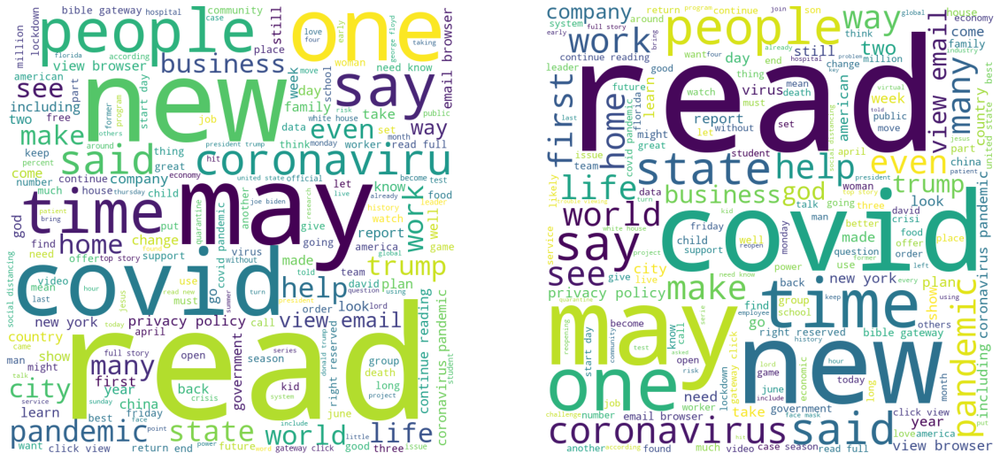

##Perspectives

After clustering and annotating users by gender, we expected to have different distribution of users in the clusters according to their gender and the theme of the cluster. The goal was to get each clusters’ theme and investigate on how companies target users based on their gender and determine whether the proportion of men and women was consistent with the theme. Do companies favor the use of certain words or phrases for a particular gender? Do the emails sent to women carry some type of emotions or sentiment the men’s ones do not have? We wanted to address that latter question by performing a sentiment analysis on the emails. However, we realized that female and male were almost equally distributed in each cluster. Besides, after plotting the wordcloud for both genders, we find out that exactly similar words (phrases) were used in the emails they received which we think is due to the fact that users’ emails addresses were randomly generated in the dataset. We did not find any bias in the way the emails were addressed to men and women.